In [1]:
import baltic as bt
import matplotlib as mpl
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
import time
import re

def colourDict(data,cmap=mpl.cm.viridis,sort=False):
    """
    returns a dictionary of unique data_items:colour hex code, normalised
    takes a list of items and a cmap as mpl.cm.name. If sort = False, the function takes an ordered list of unique elements
    """
    cmap=cmap # default viridis
    data_unique=data if sort == False else list(set(data)) # includes nan values as a key. That is desirable sometimes
    norm = mpl.colors.Normalize(vmin=0, vmax=len(data_unique))
    colors = [cmap(norm(value)) for value in range(len(data_unique))]
    return dict(zip(data_unique,colors))

# 1. Download and clean the sequences

In [ ]:
%%bash
# Limoniidae taxID 43823, includes Chionea, taxID 700830

# 1. Getting all the sequences available for Limoniidae since that provides context for the new genera
# 1.1. Retrieve the sequences using the Limoniidae taxID in NCBI and filtering for sequences with “Cytochrome” in the title
# of the sequence. Then download locally the sequences in fasta format and save them in the fasta file

esearch -db nucleotide -query "txid43823[Organism] AND cytochrome[Titl]" | efetch -format fasta > txid43823_nuc.fasta;

# transforms interleaved fastas into single line fastas
awk '/^>/ {printf("\n%s\n",$0);next; } { printf("%s",$0);}  END {printf("\n");}' < txid43823_nuc.fasta > txid43823_nuc_sl.fasta;
rm txid43823_nuc.fasta;

# removes additional line added when transforming interleaved fastas into single line fastas
tail -n +2 txid43823_nuc_sl.fasta > txid43823_nuc.fasta;
rm txid43823_nuc_sl.fasta;

# 1.2. Now, replacing new lines, grep the reverse to COII or similar, then restore new lines
# removing Cytochrome Oxidase II (we only want I)

perl -p -e 's/\n/@/g' txid43823_nuc.fasta > txid43823_nuc_temp1.fasta
perl -p -e 's/@>/\n>/g' txid43823_nuc_temp1.fasta > txid43823_nuc_temp2.fasta
grep -v 'subunit II' txid43823_nuc_temp2.fasta > txid43823_nuc_temp3.fasta # most sequences of COII
grep -v 'COII' txid43823_nuc_temp3.fasta > txid43823_nuc_temp4.fasta # one left

# reinstating the new lines to go back to the fasta format
perl -p -e 's/@/\n/g' txid43823_nuc_temp4.fasta > txid43823_nuc_COI.fasta

rm *temp[0-9]*

# 2. Explore the sequences by genus

Note that a lot of the sequences are named under Limoniidae, not even a genera. maybe a species delimitation analysis could be useful, if only there were more markers per individual... maybe just clustering old school.

In [3]:
%%bash
# 2. Count sequences per genus
grep '>' txid43823_nuc_COI.fasta | cut -f2 -d' '| sort | uniq -c > txid43823_genera_count.txt

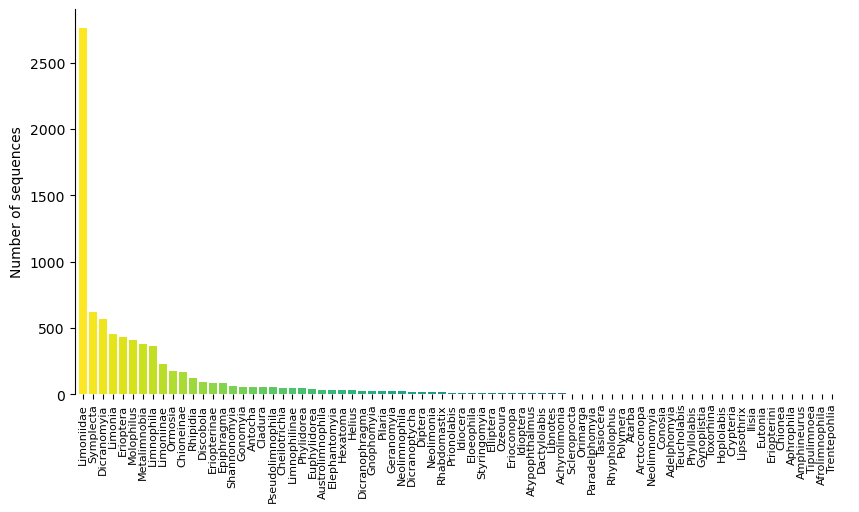

In [2]:
gen_count=pd.read_csv('./txid43823_genera_count.txt',names=['count','genus'], sep=' +', engine='python')
gen_count=gen_count.sort_values(by='count', ascending=False).reset_index().copy(deep=True)

fig,ax=plt.subplots(figsize=(10,5), facecolor='w')

xlist=[x for x in range(0,len(gen_count['genus']))]
labels=gen_count['genus']

ax.bar(x=xlist,
      height=gen_count['count'], width=0.8, bottom=None,
      label=labels,
      color=[value for value in colourDict(list(labels), cmap=mpl.cm.viridis_r).values()])

ax.set_xlim(-0.8,len(gen_count['genus'])+0.8)
[ax.spines[loc].set_visible(False) for loc in ['right','top','bottom']]

plt.xticks(ticks=xlist, labels=labels, rotation=90, fontsize=8)
plt.ylabel('Number of sequences', fontsize=10)

plt.show()

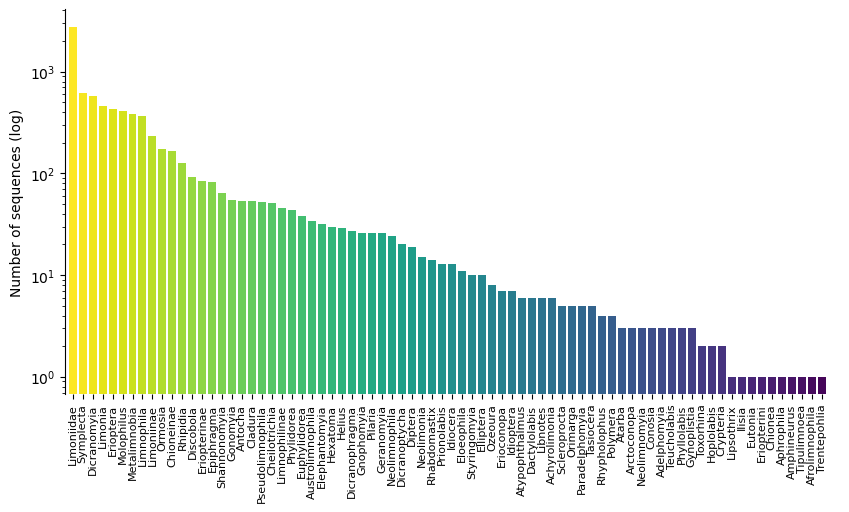

In [3]:
fig,ax=plt.subplots(figsize=(10,5), facecolor='w')

ax.bar(x=xlist,
      height=gen_count['count'], width=0.8, bottom=None,
      label=labels,
      color=[value for value in colourDict(list(labels), cmap=mpl.cm.viridis_r).values()])

ax.set_xlim(-0.8,len(gen_count['genus'])+0.8)
[ax.spines[loc].set_visible(False) for loc in ['right','top','bottom']]

plt.xticks(ticks=xlist, labels=labels, rotation=90, fontsize=8)
plt.ylabel('Number of sequences (log)', fontsize=10)
plt.yscale('log')

plt.show()

# 3. Produce a ML phylogeny to check the placement of our clade within the diversity of Tipulinae sequences available

when handling alignments with JafView, open the saved file in a text editor and change the line endings from windows to unix/linux before transforming the fastas into single liners

In jafview, I selected the sequences that were not properly aligned (partial COI sequences), deleted them, then removed all empty columns and gaps, then in bash, made the fastas into singlelines to re-align them with mafft in the command line

In [ ]:
%%bash

mafft --thread 4 txid43823_nuc_COI.fasta > txid43823_nuc_COI.fasta.aln

awk '/^>/ {printf("\n%s\n",$0);next; } { printf("%s",$0);}  END {printf("\n");}' < txid43823_nuc_COI_forward.fasta.aln.fa > txid43823_nuc_COI_forward.fasta_SL.aln.fa;
rm txid43823_nuc_COI_forward.fasta.aln.fa;
tail -n +2 txid43823_nuc_COI_forward.fasta_SL.aln.fa > txid43823_nuc_COI_forward.fasta.aln.fa;
rm txid43823_nuc_COI_forward.fasta_SL.aln.fa

mafft --thread 4 txid43823_nuc_COI_forward.fasta.aln.fa > txid43823_nuc_COI_forward.fasta.aln;
rm txid43823_nuc_COI_forward.fasta.aln.fa;

# generates a file with unique sequences that can be run after iqtree failes for presence of identical sequences
iqtree -m GTR -s txid43823_nuc_COI_forward.fasta.aln

In [146]:
# load the tree
# tree only contains unique sequences
# newick transformed into newick just by copy-pasting into figtree
# regex removal of 1/652 annotations (length) made by jafview to the aln
# "/\d/\d+-\d+'/\1'/"
treepath='./txid43823_nuc_COI_forward.fasta.aln.uniqueseq.phy.contree.nex'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)


Tree height: 0.400920
Tree length: 53.867102
annotations present

Numbers of objects in tree: 13180 (6586 nodes and 6594 leaves)



In [5]:
# load data connecting the genbank accession numbers and the species associated with the sequence
# species are scrapped from the header of the sequence
# there are more accessions than the ones we are using in the tree because this list includes COII
data=pd.read_csv('./gbid_to_spp.txt', sep='\t', names=['accession','species'])
data

,accession,species
0,ON969294.1,Limonia sp.
1,ON969293.1,Limonia sp.
2,ON969292.1,Limonia sp.
3,ON969291.1,Limonia sp.
4,ON969290.1,Limonia sp.
...,...,...
7898,KC692793.1,Dicranomyia iniquispina
7899,KC692792.1,Dicranomyia hawaiiensis
7900,KC692791.1,Dicranomyia grimshawi
7901,FR682993.1,Limonia sp.


In [6]:
# number of unique species (not all identified to the species level though)
len(data['species'].unique())

368

In [7]:
[x for x in 'Elephantomyia westwoodi'.split(' ')][0]

'Elephantomyia'

In [8]:
# for k in tree.Objects:
#     print(k.traits)
gb_spp=dict(zip(data['accession'],data['species']))
genus_list=[]
for k in tree.getExternal():
#     print(gb_spp[k.name])
    genus_list.append(gb_spp[k.name].split(' ')[0])
print('Num. of unique genera (or above): ',len(set(genus_list)))
Counter(genus_list).keys()

Num. of unique genera (or above):  76


dict_keys(['Dicranomyia', 'Cladura', 'Limoniidae', 'Neolimnophila', 'Austrolimnophila', 'Rhabdomastix', 'Erioptera', 'Dactylolabis', 'Helius', 'Paradelphomyia', 'Aphrophila', 'Limonia', 'Limoniinae', 'Geranomyia', 'Elliptera', 'Atypophthalmus', 'Hexatoma', 'Gynoplistia', 'Elephantomyia', 'Phylidorea', 'Limnophilinae', 'Pilaria', 'Pseudolimnophila', 'Neolimonia', 'Metalimnobia', 'Diptera', 'Phyllolabis', 'Molophilus', 'Dicranophragma', 'Ormosia', 'Tipulimnoea', 'Tasiocera', 'Chioneinae', 'Hoplolabis', 'Gonomyia', 'Rhypholophus', 'Ilisia', 'Erioconopa', 'Scleroprocta', 'Eriopterinae', 'Cheilotrichia', 'Symplecta', 'Limnophila', 'Prionolabis', 'Dicranoptycha', 'Epiphragma', 'Lipsothrix', 'Toxorhina', 'Conosia', 'Achyrolimonia', 'Arctoconopa', 'Amphineurus', 'Ozeoura', 'Orimarga', 'Adelphomyia', 'Crypteria', 'Euphylidorea', 'Idioptera', 'Shannonomyia', 'Polymera', 'Atarba', 'Rhipidia', 'Eloeophila', 'Neolimnomyia', 'Chionea', 'Trentepohlia', 'Teucholabis', 'Gnophomyia', 'Eutonia', 'Styring

In [9]:
# create colour dictionary for each genus
gen_col=colourDict(Counter(genus_list).keys(),cmap=mpl.cm.tab20)
# gen_col

In [149]:
# # %%script false --no-raise-error
# # print a draft tree

# fig,ax = plt.subplots(figsize=(30,700),facecolor='w')

# # collapses branches with less than 50 UFbootstrap branch support
# atree=tree.collapseBranches(lambda k: 'label' not in k.traits or k.traits['label'] < 20)

# x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
# bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
# b_func=lambda k: 1 ## branch width function

# atree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

# # for k in atree.Objects:
# #     if isinstance(k,bt.leaf) or k.branchType=='leaf':
# # #         ax.text(k.x+0.002,k.y,'%s'%(gb_spp[k.name].split(' ')[0]),
# #         ax.text(k.x,k.y,'%s %s'%(gb_spp[k.name].split(' ')[0],k.name),
# #                 va='center', ha='left',size=8,
# #                 color=gen_col[gb_spp[k.name].split(' ')[0]] if gb_spp[k.name].split(' ')[0] in gen_col.keys() else 'k')

# #         ax.text(k.x-0.007,k.y,'%s'%(k.index),va='center', ha='left',size=9,color='b') # node index, to be able to flip the clades for the map

# ax.set_ylim(-0.01,atree.ySpan+0.01)
# # ax.set_xlim(-0.01,0.1)
# # xlinebar=0.1175

# plt.xticks([])
# plt.yticks([])
    
# [ax.spines[loc].set_visible(False) for loc in ax.spines]
# # plt.savefig('./All_NCBI_nodeIDS_mcct_20210106.png',pdi=300)
# # plt.show()

# 4. Cluster sequences by 98% identity using CD-HIT 

we can select the longest representative sequence for each cluster to build a phylogeny that still reflects the diversity of Tipulinae sequences available while still being tractable.

In [10]:
%%script false --no-raise-error

%%bash

# cd hit est is for nucleotide data
# word size for thresholds 0.95-1 should be 10-11
awk '/^>/ {printf("\n%s\n",$0);next; } { printf("%s",$0);}  END {printf("\n");}' < txid43823_nuc_COI_forward.fasta.aln > temp1.aln
tail -n +2 temp1.aln > temp2.aln && mv temp2.aln temp3.aln
sed 's/-//g' temp3.aln > txid43823_nuc_COI_forwardSL.fasta

cd-hit-est -i txid43823_nuc_COI_forwardSL.fasta -o txid43823_nuc_COI_forwardSL.cdht98.fasta -c 0.98 -n 10
rm temp*aln


In [11]:
%%script false --no-raise-error

%%bash
cat Thauroconopa_perplexa.fasta >> txid43823_nuc_COI_forwardSL.cdht98.fasta
# align the sequences again, this time with the sequences from V. Podeninae
mafft txid43823_nuc_COI_forwardSL.cdht98.fasta > txid43823_nuc_COI_forwardSL.cdht98.fasta.aln

**Removing: **  
MF176190.1/1644 Ormosia sp. 1 LSR2018 haplotype 2  
MZ624389.1/1658 Dicranomyia hyalinata  

Remember that these are sequences representing a cluster of other sequences.

In [ ]:
%%script false --no-raise-error

iqtree -s txid43823_nuc_COI_forwardSL.cdht98.fasta2.aln -B 1000 -T 4 -m GTR # gtr meanwhile, to check for long branches and odd patters


Tree height: 0.310670
Tree length: 46.947097
strictly bifurcating tree
annotations present

Numbers of objects in tree: 1497 (748 nodes and 749 leaves)



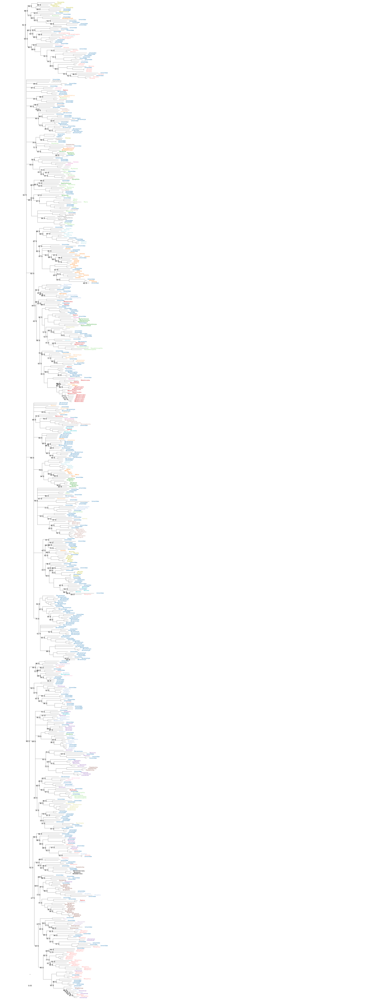

In [12]:
# load tree
treepath='./txid43823_nuc_COI_forwardSL.cdht98.fasta2.aln.contree.nex'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)

# print a draft tree

fig,ax = plt.subplots(figsize=(30,80),facecolor='w')

# collapses branches with less than 50 UFbootstrap branch support
atree=tree.collapseBranches(lambda k: 'label' not in k.traits or k.traits['label'] < 60)
atree.drawTree()

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 1 ## branch width function
s_func=lambda k: 100-10*k.height/atree.treeHeight ## size of tips
z_func=lambda k: 1

atree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in atree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
#         ax.text(k.x+0.002,k.y,'%s'%(gb_spp[k.name].split(' ')[0]),
        ax.text(k.x+0.01,k.y,'%s'%(gb_spp[k.name].split(' ')[0] if k.name in gb_spp.keys() else k.name),
                va='center', ha='left',size=6,
                color=gen_col[gb_spp[k.name].split(' ')[0]] if k.name in gb_spp.keys() and gb_spp[k.name].split(' ')[0] in gen_col.keys() else 'k')
#                 color=gen_col[gb_spp[k.name].split(' ')[0]] if gb_spp[k.name].split(' ')[0] in gen_col.keys() else 'k')
    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x+0.002,k.y+0.002,'%s'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=8,color='k',zorder=5)
#         ax.text(k.x-atree.treeHeight+0.1,k.y,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,atree.ySpan+0.1)
ax.set_xlim(-0.1,1.5)
xlinebar=0.02
ax.text(xlinebar+0.001,10,'0.05',va='top',ha='center',size=8,color='k')
ax.hlines(18,xlinebar,xlinebar+0.002,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_mcct_20210106.pdf',pdi=300)
plt.show()

In [134]:
%%script false --no-raise-error

%%bash
# now trimming spurious site columns
bmge -i txid43823_nuc_COI_forwardSL.cdht98.fasta2.aln -t DNA -o txid43823_nuc_COI_forwardSL.cdht98.fasta2.bmge.aln

   DNA sequence alignment txid43823_nuc_COI_forwardSL.cdht98.fasta2.aln
   before : 749 sequences / 734 characters
   after :  749 sequences / 642 characters                                                          


In [ ]:
%%script false --no-raise-error

iqtree -s txid43823_nuc_COI_forwardSL.cdht98.fasta2.bmge.aln -B 1000 -T 4 -m GTR # gtr meanwhile, to check for long branches and odd patters

In [78]:
# load tree
treepath='./txid43823_nuc_COI_forwardSL.cdht98.fasta2.bmge.aln.contree.nex'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)


Tree height: 0.346563
Tree length: 47.558621
strictly bifurcating tree
annotations present

Numbers of objects in tree: 1497 (748 nodes and 749 leaves)



In [80]:
data['accession_short']=''
for index,row in enumerate(data.itertuples()):
    data.loc[index,'accession_short']=row.accession.split('.')[0]
data['accession_short']
gbshort_spp=dict(zip(data['accession_short'],data['species']))
gbshort_spp['OQ873437']='Thauroconopa_aurata'
gbshort_spp['OQ873438']='Thauroconopa_perplexa'
gbshort_spp['OQ873439']='Thauroconopa_perplexa'

# for k in tree.getExternal():
#     print(gbshort_spp[k.name.split('_')[0]].split(' ')[0])

In [82]:
cluster2ssp={}
members=[]
track=False

for line in open('./txid43823_nuc_COI_forwardSL.cdht98.fasta.clstr','r'):
    if 'Cluster' not in line:
        if track == True:
            tempmatch=re.search('.+>([A-Za-z0-9\.]+)/.+',line) # get the member's accession id
            members.append(tempmatch.group(1).strip('\s\d') if tempmatch else '')
        cluster2ssp[cluster]=members
        
    elif 'Cluster' in line:
        track=False
        if track == False:
            if 'Cluster' in line: # extra check as I need this to set track to true
                members=[] # empty the contents of the list
                cluster=line.strip('>\s\d+\n') # grep the cluster name
                track=True # switch on tracking
# cluster2ssp
spp2clusters={}
for key,value in cluster2ssp.items():
    for vv in value:
        spp2clusters[vv]=key
# spp2clusters

In [83]:
data['cluster']='' # add cluster info
for index,row in enumerate(data.itertuples()):
    if row.accession in spp2clusters.keys(): # missing accessions were removed previously from aligns but are in metadata
        data.loc[index,'cluster']=spp2clusters[row.accession]
data # dataframe with all sequences downloaded from NCBI (Jan-Feb 2023)

,accession,species,accession_short,cluster,genus
0,ON969294.1,Limonia sp.,ON969294,Cluster 26,Limonia
1,ON969293.1,Limonia sp.,ON969293,Cluster 26,Limonia
2,ON969292.1,Limonia sp.,ON969292,Cluster 26,Limonia
3,ON969291.1,Limonia sp.,ON969291,Cluster 562,Limonia
4,ON969290.1,Limonia sp.,ON969290,Cluster 562,Limonia
...,...,...,...,...,...
7898,KC692793.1,Dicranomyia iniquispina,KC692793,,Dicranomyia
7899,KC692792.1,Dicranomyia hawaiiensis,KC692792,,Dicranomyia
7900,KC692791.1,Dicranomyia grimshawi,KC692791,,Dicranomyia
7901,FR682993.1,Limonia sp.,FR682993,Cluster 46,Limonia


In [84]:
# group by cluster to find the most common naming within
# sequences with no cluster number assigned are singletons and kept
data.groupby('cluster')['species'].agg(pd.Series.mode).reset_index()

,cluster,species
0,,Limonia swezeyi
1,Cluster 0,Afrolimnophila sp.
2,Cluster 1,Antocha bifida
3,Cluster 10,Elephantomyia inulta
4,Cluster 100,Limoniidae sp.
...,...,...
744,Cluster 95,Limoniidae sp.
745,Cluster 96,Limoniidae sp.
746,Cluster 97,Limoniidae sp.
747,Cluster 98,Limoniidae sp.


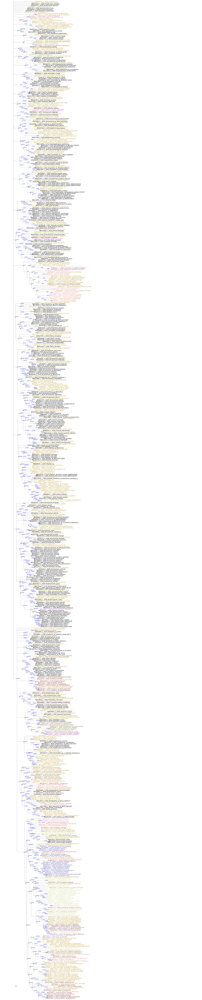

In [86]:
fig,ax = plt.subplots(figsize=(30,150),facecolor='w')

# collapses branches with less than 50 UFbootstrap branch support
atree=tree.collapseBranches(lambda k: 'label' not in k.traits or k.traits['label'] < 60)
atree.drawTree()

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 1 ## branch width function
s_func=lambda k: 100-10*k.height/atree.treeHeight ## size of tips
z_func=lambda k: 1

atree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in atree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        tipname=gbshort_spp[k.name.split('_')[0]].split(' ')[0]
        ax.text(k.x+0.01,k.y,'%s'%(k.name),
                va='center', ha='left',size=11,
                color=gen_col[tipname] if tipname in gen_col.keys() else 'k')
    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x+0.002,k.y+0.002,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=8,color='k',zorder=5)
        ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,atree.ySpan+0.1)
ax.set_xlim(-0.1,1.5)
xlinebar=0.02
ax.text(xlinebar+0.001,10,'0.05',va='top',ha='center',size=8,color='k')
ax.hlines(18,xlinebar,xlinebar+0.002,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_mcct_20210106.pdf',pdi=300)
plt.show()

# 5. Filtering the subgroup that includes Thauroconopa sequences to be able to visualise the tree better

In [87]:
for k in atree.Objects:
    cur_node=k
    parents=[]
    while cur_node:
        parents.append(cur_node.index)
        cur_node=cur_node.parent
    if 16963 in parents: # see the node number in the tree above
        k.traits['subtree']='keep'
    else:
        k.traits['subtree']='drop'

keepk=[k for k in atree.Objects if k.is_leaf() and k.traits['subtree']=='keep']
subatree=atree.reduceTree(keepk)
subatree.drawTree()

In [88]:
print(len(subatree.getExternal()))

136


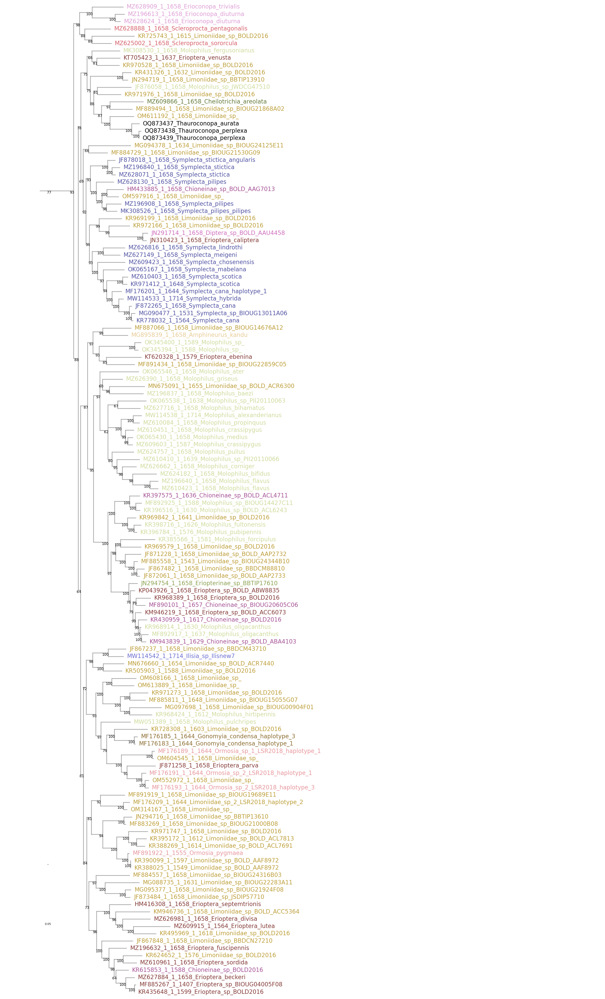

In [91]:
fig,ax = plt.subplots(figsize=(30,50),facecolor='w')

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 1.8 ## branch width function
s_func=lambda k: 100-10*k.height/atree.treeHeight ## size of tips
z_func=lambda k: 1

subatree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in subatree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        tipname=gbshort_spp[k.name.split('_')[0]].split(' ')[0]
        ax.text(k.x+0.01,k.y,'%s'%(k.name),
                va='center', ha='left',size=16,
                color=gen_col[tipname] if tipname in gen_col.keys() else 'k')
    else:
        if 'label' in k.traits and k.traits['label'] <= 100:
            ax.text(k.x+0.002,k.y+0.002,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=10,color='k',zorder=5)
#         ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,subatree.ySpan+0.1)
ax.set_xlim(-0.1,1.5)
xlinebar=0.02
ax.text(xlinebar+0.001,10,'0.05',va='top',ha='center',size=8,color='k')
ax.hlines(18,xlinebar,xlinebar+0.002,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_ML_representativeseqs_20210106.pdf',pdi=300)
plt.show()

In [92]:
# retrieve the accession numbers of the selected tree to get the metadata from
selected=[]
for k in subatree.getExternal():
    selected.append(k.name.split('_')[0])

In [93]:
selectedids=list(data[data['accession_short'].isin(selected)]['accession'].values)
len(selectedids)
data[data['accession'].isin(selectedids)].to_csv('./selected_IDs_20230131.txt',sep='\t', index=False, header=False)
# selectedids[132]

'MF176183.1'

In [238]:
%%script false --no-raise-error

%%bash
while IFS='' read -u 9 -r line; do
    ID=$(echo "$line" | cut -f 1);
    echo $ID;
    esearch -db nucleotide -query "${ID}" | efetch -format gb >> ./selected_IDs_metadata_20230131.gb;
    wait;
done 9< ./selected_IDs_20230131.txt

# failing: JF876058.1, MG895839.1, 

MF887066.1
MF885811.1
MF885558.1
MF892925.1
MF892917.1
MF891922.1
MF891919.1
MF891434.1
MF890101.1
MF889494.1
MF885267.1
MF884729.1
MF884557.1
MF883269.1
OK345400.1
OK345394.1
OK065546.1
OK065538.1
OK065430.1
OK065167.1
OM314167.1
OM552972.1
OM613889.1
OM611192.1
OM608166.1
OM604545.1
OM597916.1
MW114542.1
MW114538.1
MW114533.1
MZ610961.1
MZ610451.1
MZ610423.1
MZ610410.1
MZ610403.1
MZ610084.1
MZ609915.1
MZ609866.1
MZ609603.1
MZ609423.1
MZ628909.1
MZ628888.1
MZ628624.1
MZ628130.1
MZ628071.1
MZ627884.1
MZ627716.1
MZ627149.1
MZ626981.1
MZ626816.1
MZ626662.1
MZ626390.1
MZ625002.1
MZ624757.1
MZ624182.1
MZ196908.1
MZ196840.1
MZ196837.1
MZ196640.1
MZ196632.1
MZ196613.1
MN676660.1
MW051389.1
MN675091.1
MK308530.1
MK308526.1
JF872265.1
JF872061.1
JF871258.1
JF871228.1
HM433885.1
KR395172.1
KR398716.1
KR397575.1
KR396784.1
KR396516.1
KR390099.1
KR388269.1
KR388025.1
KR385566.1
KP043926.1
KM946736.1
KM946219.1
KM943839.1
JN310423.1
JF878018.1
JF876058.1
MG895839.1
MG097698.1
MG095377.1
MG094378.1

In [95]:
# create dictionaries or tables from the xml metadata
from itertools import islice

id2metadata={}
metadata={}
track=False

with open('./selected_IDs_metadata_20230131.gb','r') as f:
    for line in f:
        if 'LOCUS' not in line: # tracks the begining of the record, closes with </Bioseq-set>
            if track == True:
                if 'VERSION' in line:
                    tempmatch=re.search('VERSION\s(.+)\n',line)
                    accessionid=tempmatch.group(1) if tempmatch else ''
                elif 'BioProject' in line:
                    tempmatch=re.search('.+BioProject:\s(.+)\n',line)
                    biosample=tempmatch.group(1) if tempmatch else ''
                if 'TITLE' in line and 'Submission' not in line:
                    tempmatch=re.search('\s+TITLE\s+(.+)\n',line)
                    paper=tempmatch.group(1) if tempmatch else ''
                    if 'JOURNAL' not in ''.join(islice(f, 0)):
                        tempmatch1=re.search('\s+(\s.+)\n',''.join(islice(f, 1)))
                        paper=paper+tempmatch1.group(1) if tempmatch1 else ''
                elif 'identified_by' in line:
                    tempmatch=re.search('\s+.+by="(.+)"',line)
                    identifier=tempmatch.group(1) if tempmatch else ''
                elif 'country' in line:
                    tempmatch=re.search('/.+="(.+)\n',line)
                    location=tempmatch.group(1).split(' ')[0] if tempmatch else ''
                elif 'specimen_voucher' in line:
                    tempmatch=re.search('\s+.+="(.+)"',line)
                    voucher=tempmatch.group(1) if tempmatch else ''
                elif 'lat_lon' in line:
                    tempmatch=re.search('/lat_lon="(.+)"',line)
                    latlong=tempmatch.group(1) if tempmatch else ''
                elif 'SOURCE' in line:
                    tempmatch=re.search('SOURCE\s+(.+)\n',line)
                    taxname=tempmatch.group(1) if tempmatch else ''

            id2metadata[accessionid.strip(' ')]=[taxname,biosample,voucher,location.strip(':,\"\''),latlong,identifier,paper.strip('\n')]
        elif 'LOCUS' in line: # tracks the begining of the record, closes with </Bioseq-set>
            track=False
            if track == False:
                if 'LOCUS' in line:
                    metadata={} # empty the contents of the metadata dictionary
                    accessionid=''
                    taxname=''
                    location=''
                    identifier=''
                    paper=''
                    biosample=''
                    voucher=''
                    latlong=''
                    track=True # switch on tracking
id2metadata.pop('')
# id2metadata

['', '', '', '', '', '', '']

In [96]:
data['taxname']=''
data['biosample']=''
data['voucher']=''
data['location']=''
data['latlong']=''
data['identifier']=''
data['paper']=''

for index,row in enumerate(data.itertuples()):
    data.loc[index,'taxname']=id2metadata[row.accession][0] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'biosample']=id2metadata[row.accession][1] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'voucher']=id2metadata[row.accession][2] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'location']=id2metadata[row.accession][3] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'latlong']=id2metadata[row.accession][4] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'identifier']=id2metadata[row.accession][5] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'paper']=id2metadata[row.accession][6] if row.accession in id2metadata.keys() else np.nan

data[data['accession'].isin(selectedids)] # table with metadata for the sequences that made it to the final trees

,accession,species,accession_short,cluster,genus,taxname,biosample,voucher,location,latlong,identifier,paper
139,MF887066.1,Limoniidae sp.,MF887066,Cluster 37,Limoniidae,mitochondrion Limoniidae sp. BIOUG14676-A12,PRJNA472144,BIOUG14676-A12,Canada,49.477 N 57.97 W,Kate Perez,A reference library for Canadian invertebrates...
301,MF885811.1,Limoniidae sp.,MF885811,Cluster 554,Limoniidae,mitochondrion Limoniidae sp. BIOUG15055-G07,PRJNA472144,BIOUG15055-G07,Canada,49.477 N 57.97 W,Kate Perez,A reference library for Canadian invertebrates...
325,MF885558.1,Limoniidae sp.,MF885558,Cluster 736,Limoniidae,mitochondrion Limoniidae sp. BIOUG24344-B10,PRJNA472144,BIOUG24344-B10,Canada,48.794 N 123.31 W,Kate Perez,A reference library for Canadian invertebrates...
346,MF892925.1,Molophilus sp.,MF892925,Cluster 675,Molophilus,mitochondrion Molophilus sp. BIOUG14427-C11,PRJNA472144,BIOUG14427-C11,Canada,49.429 N 57.741 W,Kate Perez,A reference library for Canadian invertebrates...
347,MF892917.1,Molophilus oligacanthus,MF892917,Cluster 590,Molophilus,mitochondrion Molophilus oligacanthus,PRJNA472144,BIOUG24082-H08,Canada,48.794 N 123.31 W,Kate Perez,A reference library for Canadian invertebrates...
...,...,...,...,...,...,...,...,...,...,...,...,...
7710,MF176193.1,Ormosia sp.,MF176193,Cluster 573,Ormosia,mitochondrion Ormosia sp. 2 LSR-2018,,,,,,A checklist and identification key of cranefli...
7712,MF176191.1,Ormosia sp.,MF176191,Cluster 574,Ormosia,mitochondrion Ormosia sp. 2 LSR-2018,,,,,,A checklist and identification key of cranefli...
7714,MF176189.1,Ormosia sp.,MF176189,Cluster 576,Ormosia,mitochondrion Ormosia sp. 1 LSR-2018,,,,,,A checklist and identification key of cranefli...
7715,MF176185.1,Gonomyia condensa,MF176185,Cluster 577,Gonomyia,mitochondrion Gonomyia condensa,,,,,,A checklist and identification key of cranefli...


In [97]:
data[data['accession'].isin(selectedids)].to_csv('./selected_IDs_metadata_20230131.txt',sep='\t')

In [98]:
# find the other sequences in the clusters represented in the selected sequences
# make a new tree
# cluster2ssp

selected_clusters=[]
for key,value in spp2clusters.items():
    if key in selectedids and value not in selected_clusters:
        selected_clusters.append(value)
selected_clusters
len(selected_clusters)

133

In [99]:
data[data['cluster'].isin(selected_clusters)]

# a dictionary of clusters and all taxonomic species in them?
cluster2tax={}

for cluster in selected_clusters:
    uniqtax=[]
    [uniqtax.append(tax) for tax in list(data[data['cluster']==cluster]['species'].values) if tax not in uniqtax]
    cluster2tax[cluster]=uniqtax
cluster2tax['Cluster 171']

['Symplecta scotica', 'Symplecta cana', 'Limoniidae sp.']

In [100]:
accshort2cluster=dict(zip(data['accession_short'],data['cluster']))
identifier=dict(zip(data['accession_short'],data['identifier']))
# identifier

In [101]:
for k in subatree.getExternal():
    try:
        tipname=k.name.split('_')[0]
        print(cluster2tax[accshort2cluster[tipname]])
        print(identifier[tipname])
    except:
#         print(tipname)
        pass

['Limoniidae sp.']
Kate Perez
['Scleroprocta pentagonalis']
Jukka E. Salmela
['Scleroprocta sororcula']
Jukka E. Salmela
['Symplecta pilipes']
Jukka E. Salmela
['Chioneinae sp.', 'Symplecta stictica', 'Limoniidae sp.']

['Symplecta stictica']
Jukka E. Salmela
['Symplecta pilipes', 'Diptera sp.']
Zac D Billingham
['Limoniidae sp.', 'Symplecta pilipes']
Valerie Levesque-Beaudin
['Limoniidae sp.']
Angela Telfer
['Molophilus fergusonianus']
Zac D Billingham
['Symplecta stictica']
Pjotr Oosterbroek
['Erioptera venusta']
Angela Telfer
['Symplecta meigeni']
Jukka E. Salmela
['Erioconopa diuturna']
Jukka E. Salmela
['Limoniidae sp.']
Valerie Levesque-Beaudin
['Symplecta pilipes']
Jaroslav Stary
['Limoniidae sp.']
Angela Telfer
['Symplecta cana']

['Limoniidae sp.']
Valerie Levesque-Beaudin
['Molophilus sp.', 'Molophilus griseus', 'Molophilus testaceus']
Jukka E. Salmela
['Erioconopa trivialis']
Jukka E. Salmela
['Chioneinae sp.']

['Symplecta hybrida', 'Symplecta sp.']

['Ilisia sp.']

['Limon

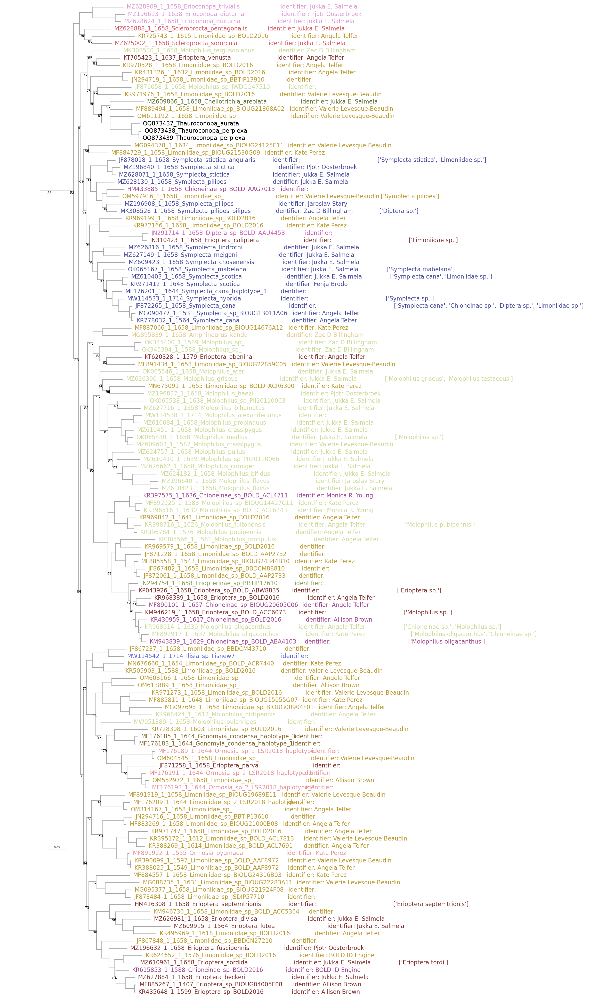

In [102]:
fig,ax = plt.subplots(figsize=(30,50),facecolor='w')

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 1.8 ## branch width function
s_func=lambda k: 100-10*k.height/atree.treeHeight ## size of tips
z_func=lambda k: 1

subatree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in subatree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        tipname=gbshort_spp[k.name.split('_')[0]].split(' ')[0]
        ax.text(k.x+0.01,k.y,'%s'%(k.name),
                va='center', ha='left',size=16,
                color=gen_col[tipname] if tipname in gen_col.keys() else 'k')
        try:
            if len(cluster2tax[accshort2cluster[k.name.split('_')[0]]]) > 1:
                ax.text(k.x+0.7,k.y,'%s'%(cluster2tax[accshort2cluster[k.name.split('_')[0]]][1:]),
                    va='center', ha='left',size=16,
                    color=gen_col[tipname] if tipname in gen_col.keys() else 'k')
        except:
            pass
        
        try:
            ax.text(k.x+0.42,k.y,'identifier: %s'%(identifier[k.name.split('_')[0]]),
                    va='center', ha='left',size=16,
                    color=gen_col[tipname] if tipname in gen_col.keys() else 'k')
        except:
            pass
    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x+0.002,k.y+0.002,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=10,color='k',zorder=5)
#         ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,subatree.ySpan+0.1)
ax.set_xlim(-0.1,1.5)
xlinebar=0.02
ax.text(xlinebar+(0.05/2),20.5,'0.05',va='top',ha='center',size=8,color='k')
ax.hlines(20,xlinebar,xlinebar+0.05,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_ML_representativeseqs_20210106.pdf',pdi=300)
plt.show()

In [ ]:
# >MF885267_1_1407_Erioptera_sp__BIOUG04005F08_cytochrome_oxidase_subunit_1__COI__gene__partial_cds__mitochondrial/1-380
# removed from the alignment

# checking the sequences that passed the hand check and numt check, get them all if they are in the selected clusters

# read headers of the hand-selected sequences. these sequences are >400 nucleotides, set into translation frame, and do not have
# stop codons (evidence of numts)

# read headers of the hand-selected sequences. these sequences are >400 nucleotides, set into translation frame, and do not have
# stop codons (evidence of numts)

# cluster2ssp
# spp2clusters

checked=[]
for f in open('./txid43823_nuc_COI_handcheckedaa.headers','r'):
    checked.append(f.strip('\n'))

retrieve=[]
for cluster in selected_clusters:
    for seq in cluster2ssp[cluster]:
        if seq not in retrieve:
            retrieve.append(seq)
            
len(retrieve)

with open('./retrieve.txt', 'w') as output:
    output.write(str(retrieve))

# 6. Recluster selected sequences after removing those with NUMTs, stop codons, or incomplete COI sequences

This time, to have a better understanding of the diversity, we cluster sequences **based on 99% identity**, that increases our resolution.

In [ ]:
%%bash
# Alignment was printed to selected_all_COI_hand.fasta.aln.uniqueseq.phy
# cdhit already takes the longest
# do cdhit and get longest sequences again, at 0.98
# then go back to not selected clusters and grab a couple of sequences as outgroups if they are available in BOLD database

iqtree -s selected_all_COI_hand.fasta.aln -m GTR

In [ ]:
%%script false --no-raise-error

%%bash
# cd hit est is for nucleotide data
# word size for thresholds 0.95-1 should be 10-11
# awk '/^>/ {printf("\n%s\n",$0);next; } { printf("%s",$0);}  END {printf("\n");}' < txid43823_nuc_COI_forward.fasta.aln > temp1.aln
# tail -n +2 temp1.aln > temp2.aln && mv temp2.aln temp3.aln
sed 's/-//g' selected_all_COI_hand.fasta.aln > selected_all_COI_hand.fasta

# we go back to check all sequences within the selected clusters and re-clusterd them after removing 
# sequences with signs of NUMTs - stop codons - or incomplete COI segments 

cd-hit-est -i selected_all_COI_hand.fasta -o selected_all_COI_hand.cdht99.fasta -c 0.99 -n 10

total seq: 2062
longest and shortest : 657 and 460
Total letters: 1213213
Sequences have been sorted

Approximated minimal memory consumption:
Sequence        : 1M
Buffer          : 1 X 12M = 12M
Table           : 1 X 16M = 16M
Miscellaneous   : 4M
Total           : 34M

Table limit with the given memory limit:
Max number of representatives: 1111266
Max number of word counting entries: 95660153

comparing sequences from          0  to       2062
..
     2062  finished        234  clusters
    
# Now add our sequences and the outgroups

mafft selected_all_COI_hand.cdht98.wOUT.fasta > selected_all_COI_hand.cdht98.wOUT.aln;
mafft selected_all_COI_hand.cdht99.wOUT.fasta > selected_all_COI_hand.cdht99.wOUT.aln;
    
iqtree -s selected_all_COI_hand.cdht98.wOUT.aln -m GTR -B 1000
iqtree -s selected_all_COI_hand.cdht99.wOUT.aln -m GTR -B 1000



Tree height: 0.233791
Tree length: 8.781373
strictly bifurcating tree
annotations present

Numbers of objects in tree: 277 (138 nodes and 139 leaves)



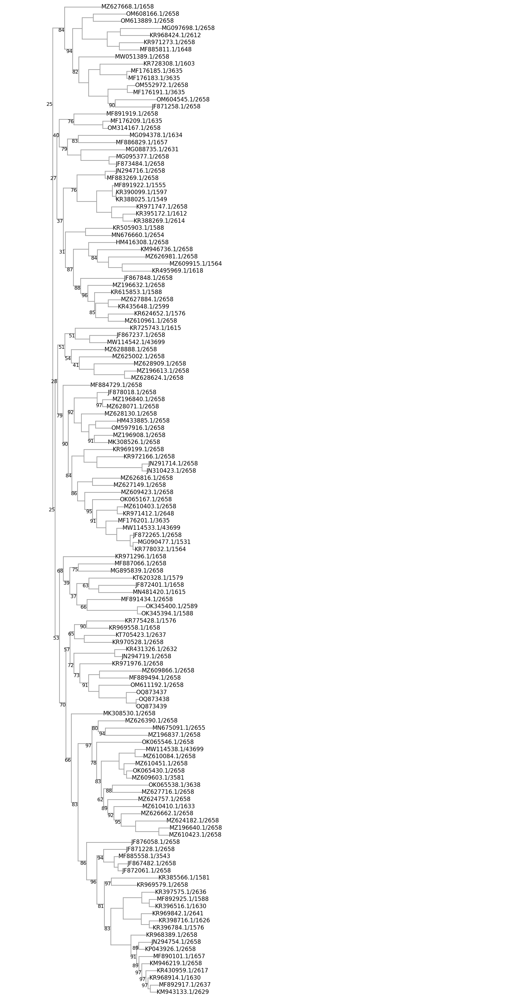

In [105]:
treepath='./selected_all_COI_hand.cdht98.wOUT.aln.contree.nex'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)

# collapses branches with less than 50 UFbootstrap branch support
atree=tree.collapseBranches(lambda k: 'label' not in k.traits or k.traits['label'] < 20)
atree.drawTree()

fig,ax = plt.subplots(figsize=(25,50),facecolor='w')

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 2 ## branch width function
s_func=lambda k: 100-10*k.height/atree.treeHeight ## size of tips
z_func=lambda k: 1

atree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in atree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        ax.text(k.x,k.y,'%s'%(k.name),
                va='center', ha='left',size=16,
                color='k')

    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x,k.y-0.002,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=14,color='k',zorder=5)
#         ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,atree.ySpan+0.1)
ax.set_xlim(-0.1,0.9)
# xlinebar=0.02
# ax.text(xlinebar+(0.05/2),20.5,'0.05',va='top',ha='center',size=8,color='k')
# ax.hlines(20,xlinebar,xlinebar+0.05,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_ML_representativeseqs_20210106.pdf',pdi=300)
plt.show()

# 7. Plotting publication figures

In [106]:
data=pd.read_csv('./gbid_to_spp.txt', sep='\t', names=['accession','species'])

data['accession_short']=''
for index,row in enumerate(data.itertuples()):
    data.loc[index,'accession_short']=row.accession.split('.')[0]
data['accession_short']
gbshort_spp=dict(zip(data['accession_short'],data['species']))
gbshort_spp['OQ873437']='Thauroconopa_aurata'
gbshort_spp['OQ873438']='Thauroconopa_perplexa'
gbshort_spp['OQ873439']='Thauroconopa_perplexa'

data

,accession,species,accession_short
0,ON969294.1,Limonia sp.,ON969294
1,ON969293.1,Limonia sp.,ON969293
2,ON969292.1,Limonia sp.,ON969292
3,ON969291.1,Limonia sp.,ON969291
4,ON969290.1,Limonia sp.,ON969290
...,...,...,...
7898,KC692793.1,Dicranomyia iniquispina,KC692793
7899,KC692792.1,Dicranomyia hawaiiensis,KC692792
7900,KC692791.1,Dicranomyia grimshawi,KC692791
7901,FR682993.1,Limonia sp.,FR682993


In [107]:
cluster2ssp={}
for line in open('./selected_all_COI_hand.cdht99.fasta.clstr','r'):
    if 'Cluster' not in line:
        if track == True:
            tempmatch=re.search('.+>([A-Za-z0-9\.]+)/.+',line) # get the member's accession id
            members.append(tempmatch.group(1).strip('\s\d') if tempmatch else '')
        cluster2ssp[cluster]=members
        
    elif 'Cluster' in line:
        track=False
        if track == False:
            if 'Cluster' in line: # extra check as I need this to set track to true
                members=[] # empty the contents of the list
                cluster=line.strip('>\s\d+\n') # grep the cluster name
                track=True # switch on tracking
# cluster2ssp
spp2clusters={}
for key,value in cluster2ssp.items():
    for vv in value:
        spp2clusters[vv]=key
# spp2clusters

data['cluster']='' # add cluster info

for index,row in enumerate(data.itertuples()):
    if row.accession in spp2clusters.keys(): # missing accessions were removed previously from aligns but are in metadata
        data.loc[index,'cluster']=spp2clusters[row.accession]
data

,accession,species,accession_short,cluster
0,ON969294.1,Limonia sp.,ON969294,
1,ON969293.1,Limonia sp.,ON969293,
2,ON969292.1,Limonia sp.,ON969292,
3,ON969291.1,Limonia sp.,ON969291,
4,ON969290.1,Limonia sp.,ON969290,
...,...,...,...,...
7898,KC692793.1,Dicranomyia iniquispina,KC692793,
7899,KC692792.1,Dicranomyia hawaiiensis,KC692792,
7900,KC692791.1,Dicranomyia grimshawi,KC692791,
7901,FR682993.1,Limonia sp.,FR682993,


In [109]:
# group by cluster to find the most common naming within
# species with no clustering name are singletons and keept anyways
data.groupby('cluster')['species'].agg(pd.Series.mode).reset_index()

,cluster,species
0,,Limoniidae sp.
1,Cluster 0,Ilisia sp.
2,Cluster 1,Molophilus alexanderianus
3,Cluster 10,Molophilus ater
4,Cluster 100,Erioptera sp.
...,...,...
230,Cluster 95,Limoniidae sp.
231,Cluster 96,Limoniidae sp.
232,Cluster 97,Limoniidae sp.
233,Cluster 98,Limoniidae sp.


In [110]:
# upload ML
treepath='./selected_all_COI_hand.cdht99.wOUT.aln.contree.nex'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)

# collapses branches with less than 50 UFbootstrap branch support
mltree=tree.collapseBranches(lambda k: 'label' not in k.traits or k.traits['label'] < 50)
mltree.drawTree()


Tree height: 0.230734
Tree length: 9.478107
strictly bifurcating tree
annotations present

Numbers of objects in tree: 485 (242 nodes and 243 leaves)



In [111]:
# upload BI
treepath='./selected_all_COI_hand.cdht99.wOUT_mcc.tree'

tree=bt.loadNexus(treepath,absoluteTime=False,tip_regex='_([0-9\-]+)$')
tree.traverse_tree()
tree.treeStats()
tree.drawTree()
tree.setAbsoluteTime(0)

# collapses branches with less than 50 UFbootstrap branch support
bitree=tree.collapseBranches(lambda k: 'posterior' not in k.traits or k.traits['posterior'] < 0.50)
bitree.drawTree()


Tree height: 1.066025
Tree length: 58.723964
strictly bifurcating tree
annotations present

Numbers of objects in tree: 485 (242 nodes and 243 leaves)



In [336]:
%%script false --no-raise-error
selectedids=[]
for k in bitree.getExternal():
#     print(k.name.split('/')[0])
    selectedids.append(k.name.split('/')[0])
selectedids

['KR717658.1',
 'KR724533.1',
 'KR725743.1',
 'JF872401.1',
 'MN481420.1',
 'KR971296.1',
 'MZ196632.1',
 'MZ627884.1',
 'KR435648.1',
 'MZ610961.1',
 'KR624652.1',
 'KR615853.1',
 'MZ609915.1',
 'KR512631.1',
 'KR514192.1',
 'KR495969.1',
 'HM416308.1',
 'MZ626981.1',
 'KM946736.1',
 'JF867848.1',
 'KR395128.1',
 'KR390350.1',
 'KR971747.1',
 'KR388269.1',
 'KR395172.1',
 'MF891922.1',
 'KR390099.1',
 'KR388025.1',
 'MF891919.1',
 'MF883269.1',
 'JN294716.1',
 'MN676660.1',
 'KR625772.1',
 'KR505903.1',
 'MW114542.1',
 'JF867237.1',
 'OM604545.1',
 'MF176189.1',
 'MF176191.1',
 'OM552972.1',
 'MF176193.1',
 'MG093040.1',
 'JF871015.1',
 'MG089370.1',
 'JF871258.1',
 'MF886829.1',
 'MF176185.1',
 'MF176183.1',
 'KR728308.1',
 'OM613889.1',
 'OM608166.1',
 'KR971273.1',
 'MF885811.1',
 'KR516540.1',
 'MG097698.1',
 'KR398786.1',
 'KR968424.1',
 'MZ628888.1',
 'MZ625002.1',
 'MZ628624.1',
 'MZ196613.1',
 'MZ628909.1',
 'KR969558.1',
 'MZ627668.1',
 'MZ627149.1',
 'MZ626816.1',
 'MZ609423

In [167]:
%%script false --no-raise-error
%%bash
while IFS='' read -u 9 -r line; do
    ID=$(echo "$line" | cut -f 1);
    echo $ID;
    esearch -db nucleotide -query "${ID}" | efetch -format gb >> ./selected_IDs_metadata_20230131.gb;
    wait;
done 9< ./selected_IDs_20230210.txt

In [113]:
%%script false --no-raise-error
# create dictionaries or tables from the xml metadata
from itertools import islice

id2metadata={}
metadata={}
track=False

with open('./selected_IDs_metadata_20230131.gb','r') as f:
    for line in f:
        if 'LOCUS' not in line: # tracks the begining of the record, closes with </Bioseq-set>
            if track == True:
                if 'VERSION' in line:
                    tempmatch=re.search('VERSION\s(.+)\n',line)
                    accessionid=tempmatch.group(1) if tempmatch else ''
                elif 'BioProject' in line:
                    tempmatch=re.search('.+BioProject:\s(.+)\n',line)
                    biosample=tempmatch.group(1) if tempmatch else ''
                if 'TITLE' in line and 'Submission' not in line:
                    tempmatch=re.search('\s+TITLE\s+(.+)\n',line)
                    paper=tempmatch.group(1) if tempmatch else ''
                    if 'JOURNAL' not in ''.join(islice(f, 0)):
                        tempmatch1=re.search('\s+(\s.+)\n',''.join(islice(f, 1)))
                        paper=paper+tempmatch1.group(1) if tempmatch1 else ''
                elif 'identified_by' in line:
                    tempmatch=re.search('\s+.+by="(.+)"',line)
                    identifier=tempmatch.group(1) if tempmatch else ''
                elif 'country' in line:
                    tempmatch=re.search('/.+="(.+)\n',line)
                    location=tempmatch.group(1).split(' ')[0] if tempmatch else ''
                elif 'specimen_voucher' in line:
                    tempmatch=re.search('\s+.+="(.+)"',line)
                    voucher=tempmatch.group(1) if tempmatch else ''
                elif 'lat_lon' in line:
                    tempmatch=re.search('/lat_lon="(.+)"',line)
                    latlong=tempmatch.group(1) if tempmatch else ''
                elif 'SOURCE' in line:
                    tempmatch=re.search('SOURCE\s+(.+)\n',line)
                    taxname=tempmatch.group(1) if tempmatch else ''

            id2metadata[accessionid.strip(' ')]=[taxname,biosample,voucher,location.strip(':,\"\''),latlong,identifier,paper.strip('\n')]
        elif 'LOCUS' in line: # tracks the begining of the record, closes with </Bioseq-set>
            track=False
            if track == False:
                if 'LOCUS' in line:
                    metadata={} # empty the contents of the metadata dictionary
                    accessionid=''
                    taxname=''
                    location=''
                    identifier=''
                    paper=''
                    biosample=''
                    voucher=''
                    latlong=''
                    track=True # switch on tracking
id2metadata.pop('')
id2metadata

data['taxname']=''
data['biosample']=''
data['voucher']=''
data['location']=''
data['latlong']=''
data['identifier']=''
data['paper']=''

for index,row in enumerate(data.itertuples()):
    data.loc[index,'taxname']=id2metadata[row.accession][0] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'biosample']=id2metadata[row.accession][1] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'voucher']=id2metadata[row.accession][2] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'location']=id2metadata[row.accession][3] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'latlong']=id2metadata[row.accession][4] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'identifier']=id2metadata[row.accession][5] if row.accession in id2metadata.keys() else np.nan
    data.loc[index,'paper']=id2metadata[row.accession][6] if row.accession in id2metadata.keys() else np.nan

data[data['accession'].isin(selectedids)]

In [114]:
# make a colour dictionary
data['genus']=''
for index,row in enumerate(data.itertuples()):
    data.loc[index,'genus']=row.species.split(' ')[0]
# data['genus'].unique()

In [115]:
data[~data['cluster'].isin([''])]['genus'].unique()

array(['Molophilus', 'Limoniidae', 'Symplecta', 'Eriopterinae',
       'Erioptera', 'Chioneinae', 'Ormosia', 'Ilisia', 'Cheilotrichia',
       'Erioconopa', 'Scleroprocta', 'Diptera', 'Amphineurus', 'Gonomyia'],
      dtype=object)

In [116]:
print(len(data[~data['cluster'].isin([''])]['genus'].unique()))

14


In [117]:
# gen_col=colourDict(data[~data['cluster'].isin([''])]['genus'].unique(),cmap=mpl.cm.gist_rainbow,sort=True)
gen_col=colourDict(data[~data['cluster'].isin([''])]['genus'].unique(),cmap=mpl.cm.tab20b_r,sort=True)

In [118]:
for k in mltree.getExternal():
    name=k.name.split('/')[0]
    try:
        gen=data[data['accession']==name]['genus'].values[0]
    except:
        print(k.name)
        gen=k.name
    k.traits['genus_color']=gen_col[gen] if gen in gen_col.keys() else 'k'
    k.traits['display']='%s %s'%(name,gen)
    cur_node=k
    while cur_node:
        cur_node.traits['color']=gen_col[gen] if gen in gen_col.keys() else 'k'
        cur_node=cur_node.parent
#     print(k.name.split('/')[0])

for k in bitree.getExternal():
    name=k.name.split('/')[0]
    try:
        gen=data[data['accession']==name]['genus'].values[0]
    except:
        print(k.name)
        gen=k.name.split(' ')[0]
    k.traits['genus_color']=gen_col[gen] if gen in gen_col.keys() else 'k'
    k.traits['display']='%s %s'%(name.split(' ')[0],gen)
    cur_node=k
    while cur_node:
        cur_node.traits['color']=gen_col[gen] if gen in gen_col.keys() else 'k'
        cur_node=cur_node.parent
#     print(k.name.split('/')[0])

OQ873437
OQ873438
OQ873439
OQ873437 Thauroconopa aurata
OQ873438 Thauroconopa perplexa
OQ873439 Thauroconopa perplexa


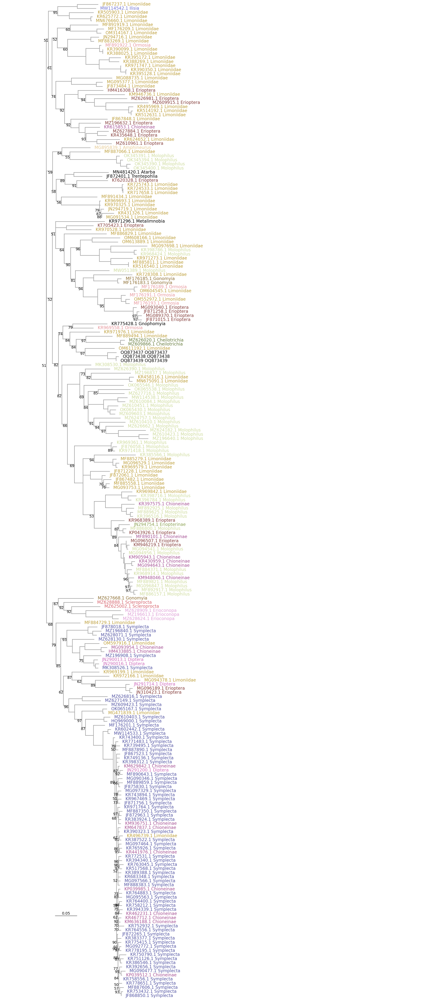

In [119]:
fig,ax = plt.subplots(figsize=(30,68),facecolor='w')

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 2 ## branch width function
s_func=lambda k: 100-10*k.height/mltree.treeHeight ## size of tips
z_func=lambda k: 1

mltree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in mltree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
#         ax.text(k.x+0.01,k.y,'%s'%(k.name),
        ax.text(k.x+0.01,k.y,'%s'%(k.traits['display'] if 'display' in k.traits.keys() else k.name),
                va='center', ha='left',size=16,
                color=k.traits['genus_color'] if 'genus_color' in k.traits.keys() else 'k')

    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x,k.y-0.002,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=14,color='k',zorder=5)
#         ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,mltree.ySpan+0.1)
ax.set_xlim(-0.1,0.9)
xlinebar=0.02
ax.text(xlinebar+(0.05/2),21,'0.05',va='top',ha='center',size=14,color='k')
ax.hlines(20,xlinebar,xlinebar+0.05,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
# plt.savefig('./Tipuliinae_ML_representativeseqs_20210210.pdf',pdi=300, bbox_inches='tight')
# plt.savefig('./Tipuliinae_ML_representativeseqs_20210210.png',pdi=300, bbox_inches='tight')
plt.show()

In [121]:
for k in mltree.Objects:
    if k.height >=0.13:
        k.traits['type']='collapse'
    else:
        k.traits['type']='uncollapse'
#     print(k.traits['type'])

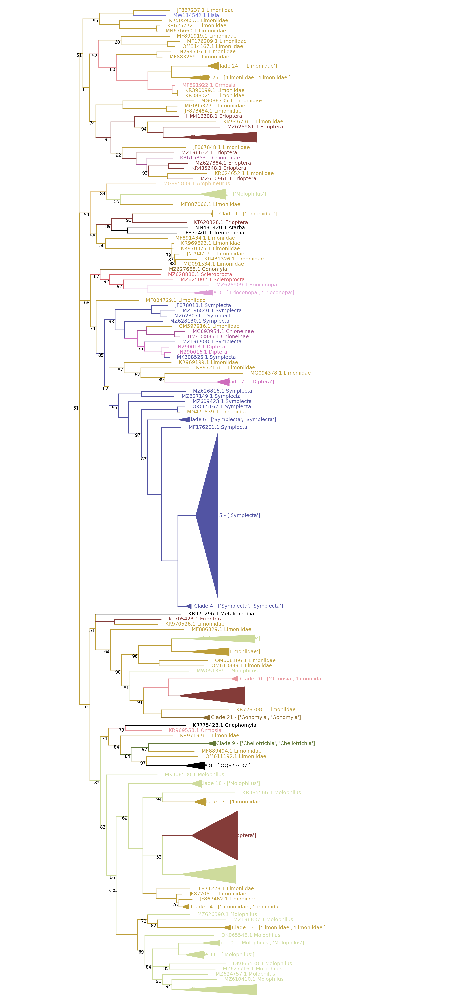

In [124]:
fig,ax = plt.subplots(figsize=(30,65),facecolor='w')

mltree.uncollapseSubtree()

collapse_target=lambda k: k.is_node() and 'type' in k.parent.traits and k.traits['type']!=k.parent.traits['type']

for idx,k in enumerate(mltree.getBranches(collapse_target)):
    includes=[kk.traits['display'].split(' ')[1] for kk in k.children if 'display' in kk.traits.keys()]
    mltree.collapseSubtree(k,'Clade %d - %s'%(idx+1,includes),widthFunction=lambda k: len(k.leaves)/2)
    
x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: k.traits['color'] if 'color' in k.traits.keys() else '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 2.5 ## branch width function
s_func=lambda k: 100-10*k.height/mltree.treeHeight ## size of tips
        
mltree.plotTree(ax,colour=bc_func,width=b_func, zorder=1) ## plot collapsed tree

clade_objects=lambda k: isinstance(k,bt.clade) ## identify clade objects

for k in mltree.getExternal(clade_objects): ## iterate over tip-like objects that are clades
    start_x=k.x ## get beginning of triangle
    end_x=k.lastHeight
    y=k.y
    c=k.traits['color'] if 'color' in k.traits.keys() else 'k'
    
    lower_left=[start_x,y-0.0005*len(mltree.Objects)]
    upper_left=[start_x,y+0.0005*len(mltree.Objects)]
    upper_right=[end_x,y+k.width/2.0]
    lower_right=[end_x,y-k.width/2.0]
    
    clade=plt.Polygon((lower_left,upper_left,upper_right,lower_right),
                      facecolor=c,edgecolor=c,zorder=3) ## define a triangle polygon
    ax.add_patch(clade) ## add polygon

for k in mltree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        ax.text(k.x+0.01,k.y,
            '%s'%(k.traits['display'] if 'display' in k.traits.keys() else k.name),
            color=k.traits['color'] if 'color' in k.traits.keys() else 'k',
            ha='left',va='center',size=18) ## add text label to clade
    else:
        if 'label' in k.traits and k.traits['label'] < 98:
            ax.text(k.x-0.001,k.y-0.005,'%d'%(k.traits['label'] if 'label' in k.traits else ''),
                    va='top',ha='right',size=16,color='k',zorder=5)

    
ax.set_ylim(-0.1,mltree.ySpan+0.1)
ax.set_xlim(-0.1,0.5)
plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]

xlinebar=0.02
ax.text(xlinebar+(0.05/2),21,'0.05',va='top',ha='center',size=14,color='k')
ax.hlines(20,xlinebar,xlinebar+0.05,linestyle='solid',color='k',lw=1) 

# plt.savefig('./Tipuliinae_ML_clades_representativeseqs_20230531.svg',dpi=300, bbox_inches='tight')
plt.show()


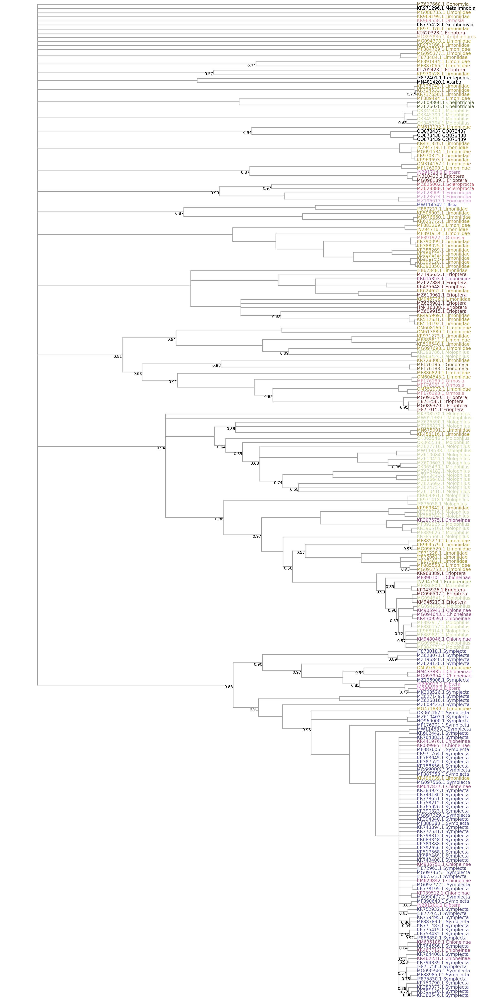

In [126]:
fig,ax = plt.subplots(figsize=(30,65),facecolor='w')

x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 2.5 ## branch width function
s_func=lambda k: 100-10*k.height/bitree.treeHeight ## size of tips
z_func=lambda k: 1

bitree.plotTree(ax,x_attr=x_attr,colour=bc_func,width=b_func) ## plot branches

for k in bitree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
#         ax.text(k.x+0.01,k.y,'%s'%(k.name),
        ax.text(k.x+0.001,k.y,'%s'%(k.traits['display'] if 'display' in k.traits.keys() else k.name),
                va='center', ha='left',size=16,
                color=k.traits['genus_color'] if 'genus_color' in k.traits.keys() else 'k')

    else:
        if 'posterior' in k.traits and k.traits['posterior'] < 0.98:
            ax.text(k.x,k.y-0.002,'%.2f'%(k.traits['posterior'] if 'posterior' in k.traits else ''),
                    va='top',ha='right',size=14,color='k',zorder=5)
#         ax.text(k.x+0.002,k.y-0.0025,'%s'%(k.index),va='center', ha='left',size=8,color='b') # node index, to be able to flip the clades for the map

ax.set_ylim(-0.1,bitree.ySpan+0.1)
ax.set_xlim(-0.1,1.2)
# xlinebar=0.02
# ax.text(xlinebar+(0.05/2),21,'0.05',va='top',ha='center',size=8,color='k')
# ax.hlines(20,xlinebar,xlinebar+0.05,linestyle='solid',color='k',lw=1) 

plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]
plt.savefig('./Tipuliinae_BI_representativeseqs_20230531.pdf',dpi=300, bbox_inches='tight')
plt.savefig('./Tipuliinae_BI_representativeseqs_20230531.png',dpi=300, bbox_inches='tight')

plt.show()

In [127]:
for k in bitree.Objects:
    if k.height >=0.99:
        k.traits['type']='collapse'
    else:
        k.traits['type']='uncollapse'
#     print(k.traits['type'])

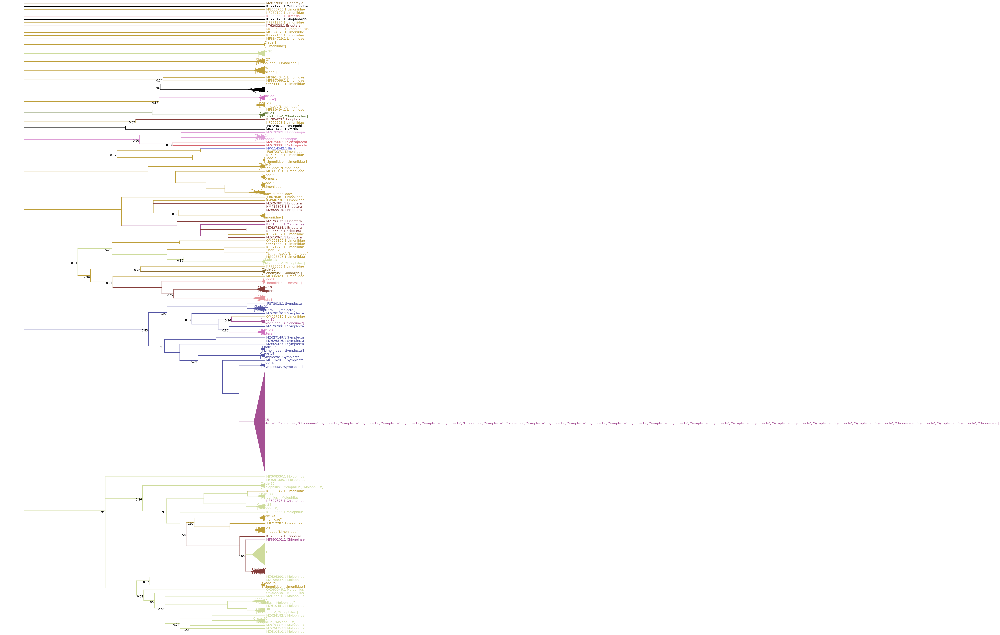

In [128]:
fig,ax = plt.subplots(figsize=(30,65),facecolor='w')

bitree.uncollapseSubtree()

collapse_target=lambda k: k.is_node() and 'type' in k.parent.traits and k.traits['type']!=k.parent.traits['type']

for idx,k in enumerate(bitree.getBranches(collapse_target)):
    includes=[kk.traits['display'].split(' ')[1] for kk in k.children if 'display' in kk.traits.keys()]
    bitree.collapseSubtree(k,'Clade %d\n%s'%(idx+1,includes),widthFunction=lambda k: len(k.leaves)/2)
    
x_attr=lambda k: k.x #-atree.treeHeight if k.x else -atree.treeHeight
bc_func=lambda k: k.traits['color'] if 'color' in k.traits.keys() else '#a3a3a3' # Uses the colour dictionaries above and colours the branches based on genera
b_func=lambda k: 2.5 ## branch width function
s_func=lambda k: 100-10*k.height/bitree.treeHeight ## size of tips
        
bitree.plotTree(ax,colour=bc_func,width=b_func, zorder=1) ## plot collapsed tree

clade_objects=lambda k: isinstance(k,bt.clade) ## identify clade objects

for k in bitree.getExternal(clade_objects): ## iterate over tip-like objects that are clades
    start_x=k.x ## get beginning of triangle
    end_x=k.lastHeight
    y=k.y
    c=k.traits['color'] if 'color' in k.traits.keys() else 'k'
    
    lower_left=[start_x,y-0.0005*len(bitree.Objects)]
    upper_left=[start_x,y+0.0005*len(bitree.Objects)]
    upper_right=[end_x,y+k.width/2.0]
    lower_right=[end_x,y-k.width/2.0]
    
    clade=plt.Polygon((lower_left,upper_left,upper_right,lower_right),
                      facecolor=c,edgecolor=c,zorder=3) ## define a triangle polygon
    ax.add_patch(clade) ## add polygon

for k in bitree.Objects:
    if isinstance(k,bt.leaf) or k.branchType=='leaf':
        ax.text(k.x+0.005,k.y,
            '%s'%(k.traits['display'] if 'display' in k.traits.keys() else k.name),
            color=k.traits['color'] if 'color' in k.traits.keys() else 'k',
            ha='left',va='center',size=18) ## add text label to clade
    else:
        if 'posterior' in k.traits and k.traits['posterior'] < 0.98:
            ax.text(k.x-0.002,k.y-0.01,'%.2f'%(k.traits['posterior'] if 'posterior' in k.traits else ''),
                    va='top',ha='right',size=16,color='k',zorder=5)

    
ax.set_ylim(-0.1,bitree.ySpan+0.1)
ax.set_xlim(-0.1,1.2)
plt.xticks([])
plt.yticks([]) 
    
[ax.spines[loc].set_visible(False) for loc in ax.spines]

plt.savefig('./Tipuliinae_BI_clades_representativeseqs_20230531.png',dpi=300, bbox_inches='tight')
plt.show()


In [137]:
len(data[~data['cluster'].isin([''])]['cluster'].unique())

234

In [140]:
%%script false --no-raise-error
data[data['accession'].isin(selectedids)].to_csv('./selected_IDs_metadata_20230531.txt', index=False)

In [141]:
data[data['accession'].isin(selected)].to_csv('./selected_IDs_20230531.txt',sep='\t', index=False, header=False)